<p>
    <a href="https://umt.edu.al/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2024/11/Universiteti-Metropolitan-Tirana.webp" width="200" alt="UMT Logo">
    </a>
</p>
<p>
    <a href="https://skills.network" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo">
    </a>
</p>

**<h1> Manipulimi i Imazheve </h1>**

Koha e nevojshme e percaktuar: **+30** minuta

<h2>Objectivat</h2>

Në këtë laborator, do të mësoni si të manipuloni imazhet dhe matricat e imazheve(arrayt) në OpenCV. Do të mësoni si të kopjoni një imazh për të shmangur aliasing-un. Ne do të trajtojmë rrotullimin e imazheve dhe prishjen e imazheve. Gjithashtu, do të mësoni të ndryshoni pikselët e imazheve; kjo do t'ju lejojë të vizatoni forma, të shkruani tekste dhe të vendosni imazhe mbi imazhe të tjera.

**Aliasing** në imazhe është një efekt vizual i padëshiruar që ndodh kur një sinjal (në këtë rast, një imazh dixhital) mostrohet me një rezolucion të pamjaftueshëm, duke shkaktuar artefakte si linja të thyera ose modele moiré. Kjo ndodh kur frekuenca e detajeve në imazh është më e lartë se frekuenca e mostrimit të sensorit të kamerës ose ekranit.

Shembuj të aliasing-ut në imazhe:
1) "Stair-step effect" (Efekti i shkallëve) – Ndodh kur vijat diagonale ose të lakuara duken si një seri shkallësh në vend që të jenë të lëmuara.
2) Moiré Patterns (Modelet moiré) – Paraqiten kur një model i përsëritur në një imazh ndërvepron me një model tjetër të përsëritur të sensorit të kamerës, duke krijuar artefakte me ngjyra ose forma të valëzuara.
3) Flickering në video – Kur aliasing ndodh në një video, mund të shkaktojë dridhje të objekteve me vija të holla ose tekstura komplekse.

<ul>
    <li><a href='#MI'>Manipulimi i Imazheve</a>
        <ul>
            <li>Kopjimi i Imazheve</li>
            <li>Rrotullimi i Imazheve</li>
            <li>Prerja e një Imazhi</li>
            <li>Ndryshimi i Pikseve të Përcaktuara të Imazhit</li>
        </ul>
    </li>
</ul>


----


Shkarkoni imazhet për laboratorin:

In [5]:
import requests

# URL-të për imazhet
urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png"
]

# Përshtatja dhe shkarkimi i imazheve
for url in urls:
    response = requests.get(url)
    with open(url.split("/")[-1], 'wb') as file:
        file.write(response.content)


Importojme funksionet e nevojshme per kete laborator:

In [6]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

## Kopjimi i Imazheve

Nëse dëshironi të rishpërndani një varg te një variabël tjetër, duhet të përdorni metodën `copy`. Nëse nuk aplikoni metodën `copy()`, variabli do të tregojë për në të njëjtin vend në memorje. Merrni parasysh vargun e mëposhtëm:

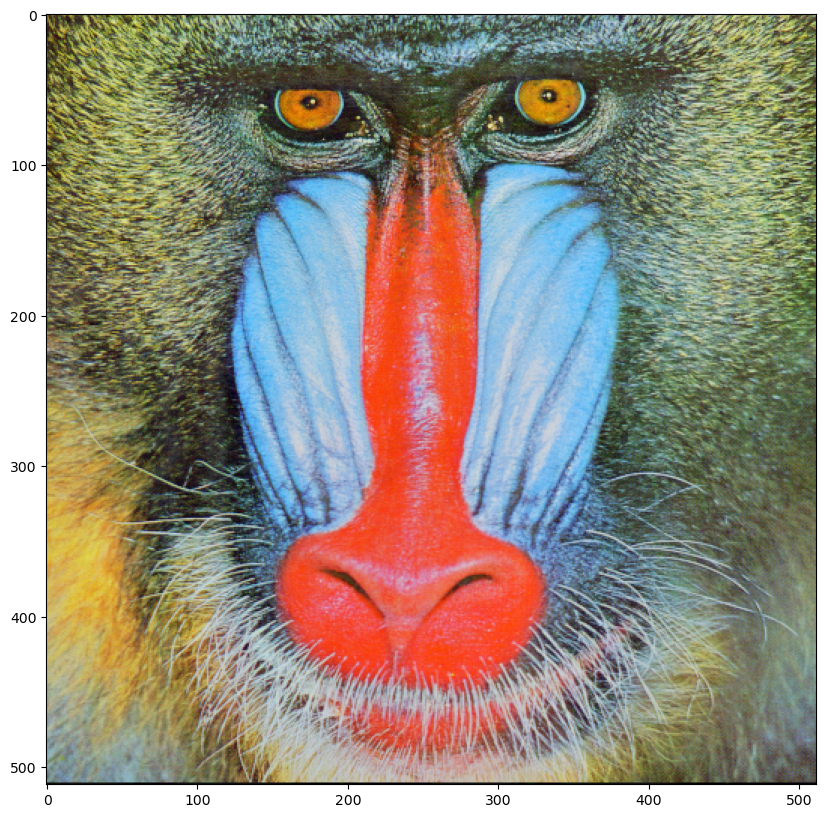

In [9]:
baboon = cv2.imread("baboon.png")
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

Nëse nuk e aplikojmë metodën `copy()`, të dyja variablat do të tregojnë në të njëjtin vend në memorie.

In [10]:
A = baboon

Ne përdorim funksionin `id` për të gjetur adresën e memorjes së objektit; ne shohim që ajo është e njëjtë me vargun origjinal.

In [11]:
id(A)==id(baboon)


True

In [12]:
id(A)

3162785937328

Megjithatë, nëse aplikohet metoda `copy()`, adresat e tyre të memorjes do të jenë të ndryshme.

In [6]:
B = baboon.copy()
id(B)==id(baboon)

False

Kur nuk aplikojmë metodën <code>copy()</code>, variabli do të tregojë në të njëjtën vendndodhje në memorje. Merrni parasysh vargun <code>baboon</code>, nëse e vendosim të gjithë vlerat e tij në zero, atëherë të gjitha vlerat në <code>A</code> do të jenë zero. Kjo ndodh sepse <code>baboon</code> dhe <code>A</code> tregojnë në të njëjtin vend në memorje, por <code>B</code> nuk do të preket.

In [9]:
baboon[:,:,] = 0

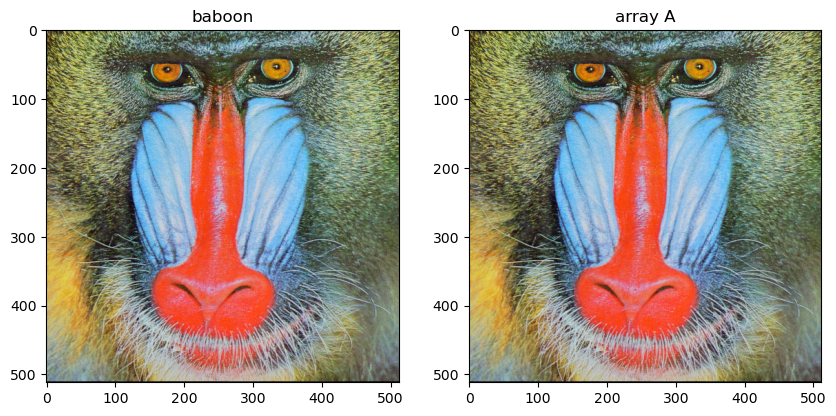

In [7]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB))
plt.title("array A")
plt.show()

Ne shohim që janë të njëjta, kjo quhet aliasing. Aliasing ndodh kur vlera e një variabli i jepet një variabli tjetër, sepse variablat janë thjesht emra që ruajnë referenca te vlerat. Mund të krahasojmë gjithashtu <code>baboon</code> dhe vargun <code>B</code>:

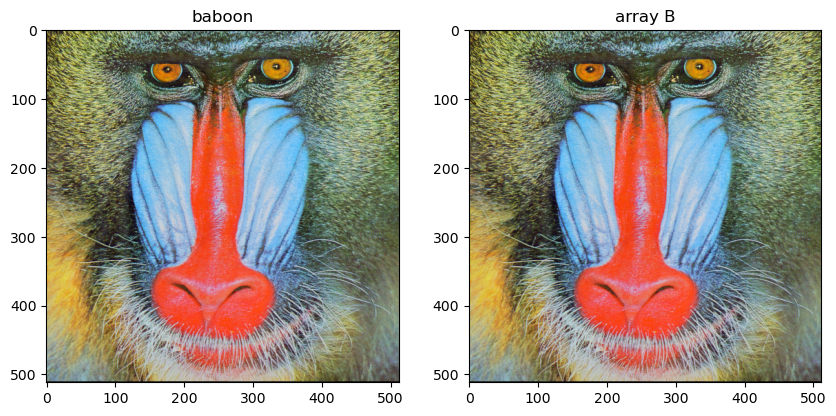

In [8]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("baboon")
plt.subplot(122)
plt.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB))
plt.title("array B")
plt.show()

Ata janë të ndryshëm sepse është përdorur metoda `copy()`.

## Reflektimi(Flipping) i Imazheve

Kthimi i imazheve përfshin renditjen e indekseve të pikseleve në mënyrë që të ndryshohet orientimi i imazhit. Merrni parasysh imazhin në vijim:

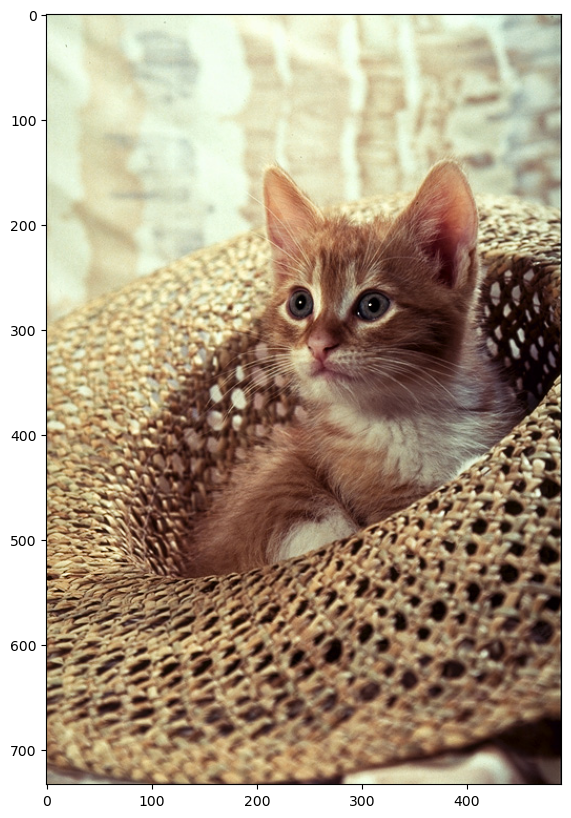

In [14]:
image = cv2.imread("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

Ne mund ta kthejmë atë në një array dhe të gjejmë formën e tij:

In [15]:
width, height,C=image.shape
print('width, height,C:',width, height,C)

width, height,C: 733 490 3


In [22]:
np.max(image[:,:,0]), np.max(image[:,:,1]), np.max(image[:,:,2])

(252, 255, 255)

In [21]:
print(image.dtype) 

uint8


Le të rrotullojmë imazhin, domethënë ta rrotullojmë vertikalisht. Së pari, krijojmë një array me përmasa të njëjta, të tipit <code>np.uint8</code> për imazhin.

In [23]:
array_flip = np.zeros((width, height,C),dtype=np.uint8)

Ne i caktojmë rreshtin e parë të pikselëve të array origjinal në rreshtin e fundit të array të ri. E përsërisim këtë proces për çdo rresht, duke rritur numrin e rreshtit për array origjinal dhe duke zvogëluar indeksin e rreshtit për array të ri, duke caktuar pikselët përkatësisht.

In [13]:
for i,row in enumerate(image):
        array_flip[width-1-i,:,:]=row

Plotojme rezultatin

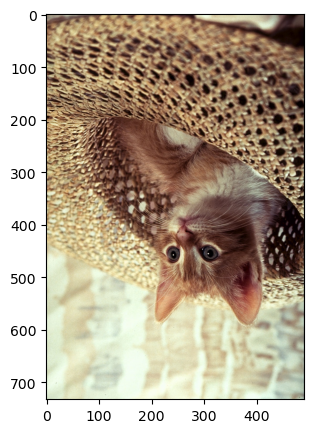

In [14]:
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(array_flip, cv2.COLOR_BGR2RGB))
plt.show()

<code>OpenCV</code> ka disa mënyra për të kthyer një imazh, ne mund të përdorim funksionin <code>flip()</code>; kemi array-in e imazhit si hyrje. Parametri është <code>flipCode</code>, i cili është vlera që tregon llojin e kthimit që dëshirojmë të bëjmë:

<li><code>flipcode</code> = 0: kthim vertikal rreth akset x</li>
<li><code>flipcode</code> > 0: kthim horizontal rreth akset y me vlerë pozitive</li>
<li><code>flipcode</code> < 0: kthim vertikal dhe horizontal, duke e kthyer rreth të dy akseve me vlerë negative</li>

Le të aplikojmë <code>flipcode</code>-t e ndryshëm në një cikël:

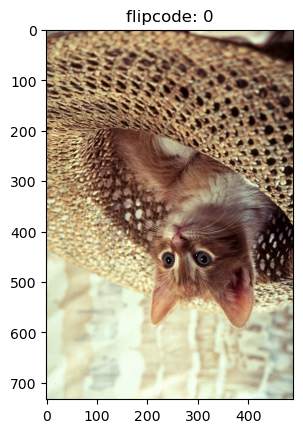

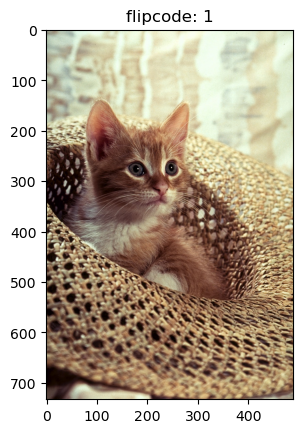

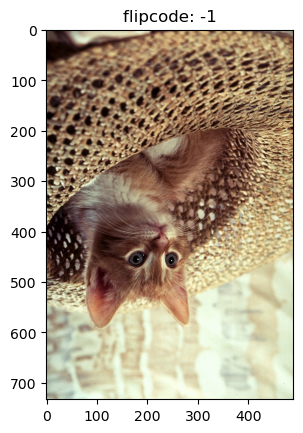

In [15]:
for flipcode in [0,1,-1]:
    im_flip =  cv2.flip(image,flipcode )
    plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
    plt.title("flipcode: "+str(flipcode))
    plt.show()

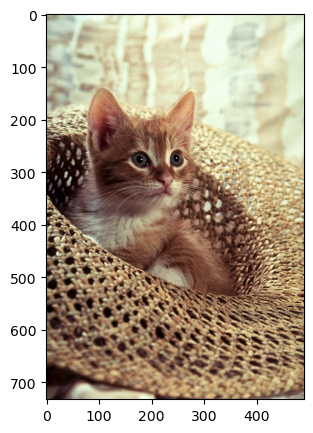

In [20]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

Ne mund të përdorim gjithashtu funksionin <code>rotate()</code>. Parametri është një numër i plotë që tregon llojin e kthimit që dëshirojmë të bëjmë.

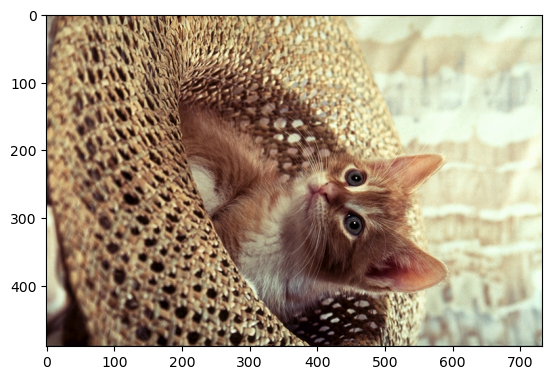

In [16]:
im_flip = cv2.rotate(image,0)
plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
plt.show()

Moduli OpenCV ka atribute të integruara që përshkruajnë llojin e kthimit, vlerat janë thjesht numra të plotë. Disa prej tyre shihen në këtë <code>dict</code>:

In [17]:
flip = {"ROTATE_90_CLOCKWISE":cv2.ROTATE_90_CLOCKWISE,
        "ROTATE_90_COUNTERCLOCKWISE":cv2.ROTATE_90_COUNTERCLOCKWISE,
        "ROTATE_180":cv2.ROTATE_180}

Ne shohim që vlerat janë numra të plotë.

In [18]:
flip["ROTATE_90_CLOCKWISE"]

0

Ne mund të vizatojmë çdo rezultat duke përdorur vlerat e ndryshme të parametrave.

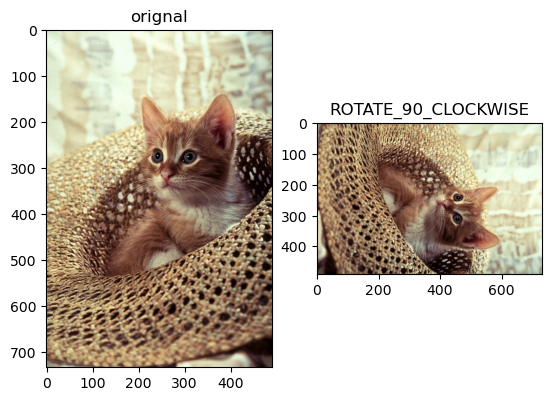

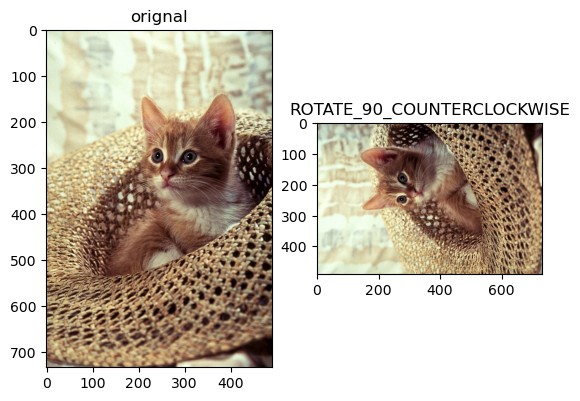

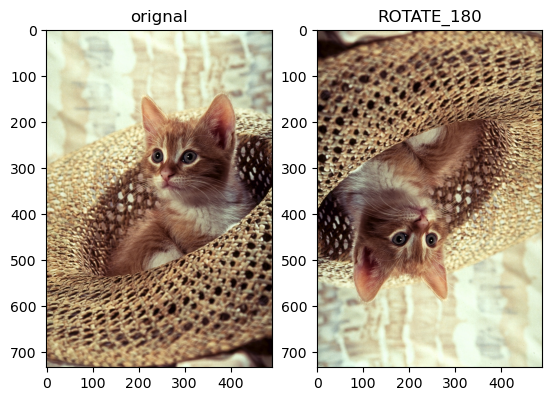

In [19]:
for key, value in flip.items():
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(cv2.rotate(image,value), cv2.COLOR_BGR2RGB))
    plt.title(key)
    plt.show()

## Prerja e një Imazhi 

Kropping është "prerja" e një pjese të imazhit dhe hedhja e pjesës tjetër; ne mund të kryejmë kropping duke përdorur arrays. Le të fillojmë me një kropping vertikal; variabli `<code>upper</code>` është rreshti i parë që dëshirojmë të përfshijmë në imazh, ndërsa variabli `<code>lower</code>` është rreshti i fundit që dëshirojmë të përfshijmë. Më pas, ne përdorim slicing për të marrë imazhin e ri.

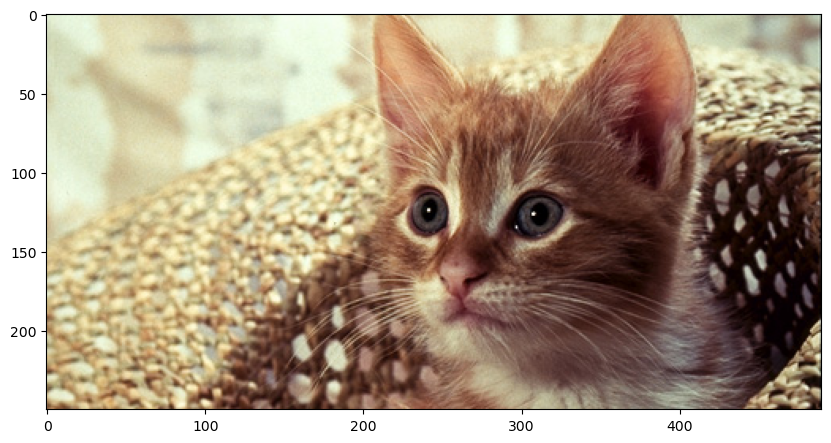

In [20]:
upper = 150
lower = 400
crop_top = image[upper: lower,:,:]
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(crop_top, cv2.COLOR_BGR2RGB))
plt.show()

Merrni parasysh array-n `<code>crop_top</code>`. Ne gjithashtu mund të bëjmë kropping horizontal; variabli `right` është kolona e parë që dëshirojmë të përfshijmë në imazh, ndërsa variabli `left` është kolona e fundit që dëshirojmë të përfshijmë në imazh.

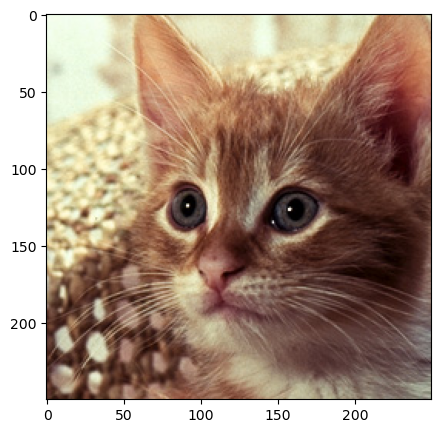

In [21]:
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(crop_horizontal, cv2.COLOR_BGR2RGB))
plt.show()

## Ndryshimi i Pikseleve të caktuar të Imazhit

Mund të ndryshojmë pikselet e përcaktuara të imazhit duke përdorur indekset e array-it; për shembull, mund të vendosim të gjitha kanalet e gjelbërta dhe blu në imazhin origjinal që kemi prerë në zero:

In [22]:
array_sq = np.copy(image)
array_sq[upper:lower,left:right,:] = 0

Mund të krahasojmë rezultatet me imazhin e ri.

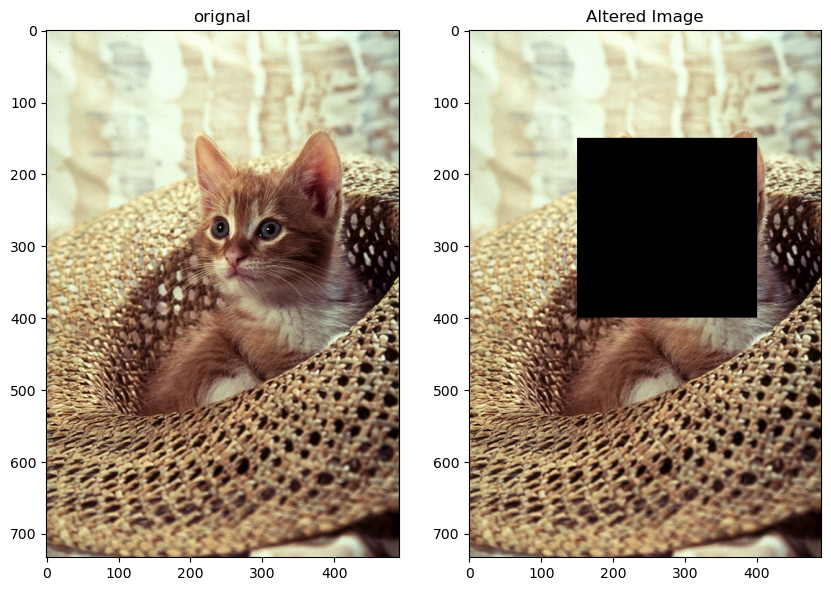

In [23]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(array_sq,cv2.COLOR_BGR2RGB))
plt.title("Altered Image")
plt.show()

Ne mund të krijojmë gjithashtu figura dhe forma me <code>OpenCV</code>, duke përdorur metodën <code>rectangle</code>. Parametri <code>pt1</code> është koordinata e sipërme e majtë e drejtkëndëshit: <code>(left, top)</code> ose $(x_0, y_0)$, ndërsa <code>pt2</code> është koordinata e poshtme e djathtë: <code>(right, lower)</code> ose $(x_1, y_1)$. Parametri <code>color</code> është një tuple që përfaqëson intensitetin e secilit kanal <code>(blue, green, red)</code>. Së fundmi, kemi trashësinë e vijës.

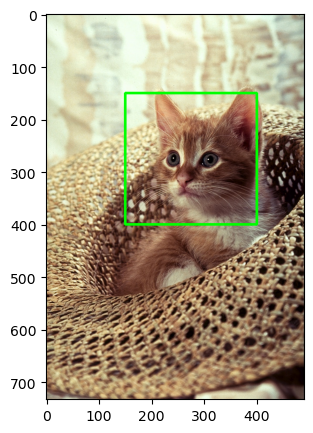

In [24]:
start_point, end_point = (left, upper),(right, lower)
image_draw = np.copy(image)
cv2.rectangle(image_draw, pt1=start_point, pt2=end_point, color=(0, 255, 0), thickness=3) 
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB))
plt.show()

Ne mund të shtojmë tekst mbi një imazh duke përdorur funksionin <code>putText</code> me këto vlera parametrash:

- <li><code>img</code>: Array i imazhit</li>
- <li><code>text</code>: Stringu i tekstit që do të mbivendoset</li>
- <li><code>org</code>: Këndi i poshtëm i majtë i stringut të tekstit në imazh</li>
- <li><code>fontFace</code>: Lloji i fontit</li>
- <li><code>fontScale</code>: Shkalla e fontit</li>
- <li><code>color</code>: Ngjyra e tekstit</li>
- <li><code>thickness</code>: Trashësia e vijave të përdorura për të vizatuar tekstin</li>
- <li><code>lineType</code>: Lloji i vijës

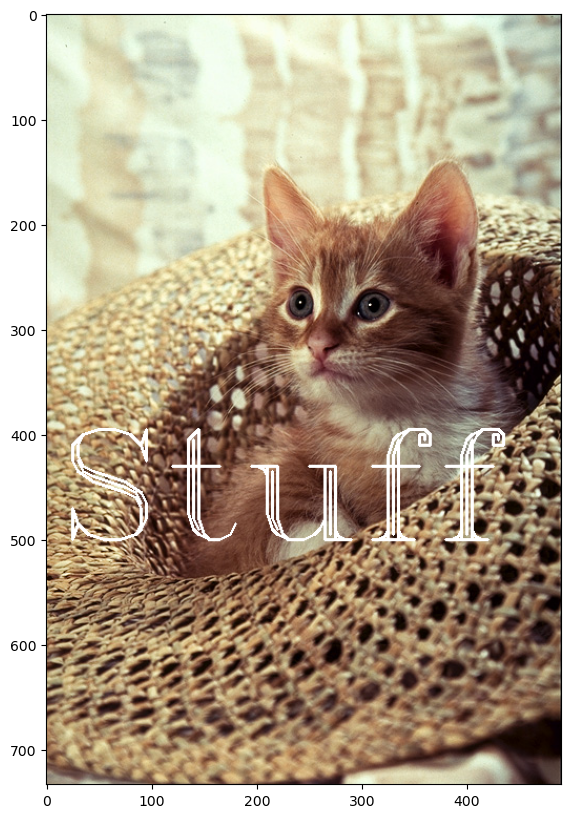

In [25]:
image_draw=cv2.putText(img=image,text='Stuff',org=(10,500),color=(255,255,255),fontFace=4,fontScale=5,thickness=2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image_draw,cv2.COLOR_BGR2RGB))
plt.show()

### Pyetja-4:  
Përdorni imazhin `baboon.png` nga ky laborator ose merrni një imazh tjetër sipas dëshirës.

Hapni imazhin dhe krijoni një objekt imazhi OpenCV të quajtur `im`, konvertoni imazhin nga formati BGR në formatin RGB, rrotulloni `im` vertikalisht rreth aksit x dhe krijoni një imazh të quajtur `im_flip`, pasqyroni `im` duke e rrotulluar horizontalisht rreth aksit y dhe krijoni një imazh të quajtur `im_mirror`, përfundimisht vizatoni të dy imazhet.

In [54]:
# shkruaj zgjidhjen tende ketu:

Klikoni dy herë **këtu** për një sugjerim.

<!-- Sugjerimi është më poshtë:

im_flip =  cv2.flip(baboon,0)
im_mirror =  cv2.flip(baboon, 1)

-->


Klikoni dy herë **këtu** për zgjidhjen:
<!-- Pergjigja eshte me poshte:

im = cv2.imread("baboon.png")

im_flip =  cv2.flip(im, 0)
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
plt.show()

im_mirror =  cv2.flip(im, 1)
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB))
plt.show()

-->

# Referenca

[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

<h3 align="center"> &#169; UMT. All rights reserved. <h3/>